<a href="https://colab.research.google.com/github/johnjos1zhaw/WatchClassificaion/blob/work/ML2_Project_johnjos1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ML2 Project of johnjos1: Watch Image Classification

## Motivation behind the Project

**Prehistory**

Originally I had in mind to create a model that could detect fake from real (original) watches. Because I know there is a huge industry behind creating imitations of famous luxury watches. But I then quickly realized, that I couldn't tell by myself, which watches are real or fake and also couldn't find an expert or a prepared dataset in such short time.

Holding on to the watch topic and look at all these different watch brands I noticed, that I also only know a few or the most famous ones and that it isn't that easy to distinguish them.

So I came up with the **goal of this project**:
To design a model that accurately classifies watches based on their images. 

**This project is relevant** in the era of e-commerce growth and personalization, as it allows for improved customer experience and efficient inventory management.

**The motivation behind this project**
The world of watches is very vast and diverse with a plenty of brands, models, features, and designs. It can be overwhelming for potential buyers and especially those new to watches. To motivation is to streamline the process of watch categorization and recommendation for online platforms and improve the shopping experience for consumers. 

In [ ]:
!pip install hvplot
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import keras
import tensorflow as tf
import itertools
import cv2
from dask import bag
from dask.diagnostics import ProgressBar
import holoviews as hv
import hvplot.pandas  # optional, for hvplot integration with pandas
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense, Input, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 43.8 MB/s eta 0:00:00


## Data Collection or Generation

Initially, I attempted web scraping directly from the website [chrono24.com](https://www.chrono24.com/search/browse.htm). Since it was my first time attempting web scraping, I faced some challenges. It took me approximately 8 hours to scrape the data, but I soon realized that the collected data was incorrect. It only captured the first few images at the top of the page, and the remaining images had a different data type that I couldn't utilize. It turned out that I needed to implement a scroll-down function due to lazy-loading of the images.

Feeling discouraged by the scraping difficulties, I decided to search for a dataset on Kaggle. Luckily, I found the [following dataset](https://www.kaggle.com/datasets/ahedjneed/fancy-watche-images), which contained well-structured data for 10 watch brands, each with 200 images per brand. The dataset was nicely balanced, which made it ideal for my initial experiments.

Despite working with the Kaggle dataset, I still wanted to try web scraping. This led me to discover a web-scraper browser add-on called [Web Scraper](https://chrome.google.com/webstore/detail/web-scraper-free-web-scra/jnhgnonknehpejjnehehllkliplmbmhn) for Google Chrome. It offered a more user-friendly and intuitive experience, allowing me to select divs and elements through simple clicks.

Afterward, I searched for a new website and came across [watchbase.com](https://watchbase.com/watches). It seemed easier to scrape data from this website, so I decided to use it. The scraping process took me exactly 10.45 hours. As a result, I obtained a CSV file containing the brand names, model names, and image file paths. This time, I implemented a scroll function to ensure that all the images were loaded.

Next, I wrote a script that iterated through the CSV file, downloaded all the images, and organized them into folders and subfolders based on the watch brands and models. I encountered some challenges during this process, such as unexpected file types (e.g., jpg, png, jpeg) and difficulties in handling the names of folders for French watch brands with special characters like é, ê, è, ä, à, and è (needed correct UTF format). Additionally, I needed to avoid downloading duplicate images from previous attempts. Incorporating all these considerations into the script took me approximately 3 more hours to complete what initially seemed like a "simple" task.

In the end, I successfully obtained all the watch brands and images for each model. However, I still needed to address the issue of having too many brands with an imbalanced distribution. To tackle this problem, I performed some exploratory data analysis (EDA)...

##EDA of Scraped Data


I have scraped the [watchbase-website](https://watchbase.com/watches) for all of it's brands and models.

First we need to mount our google drive on to google colab, where our data is stored.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Then we look at how many watch brands, models and total images we have...

In [ ]:
import os
import matplotlib.pyplot as plt

data_dir = '/content/drive/MyDrive/included_data'  # Replace with the path to your data folder

# Get a list of all brands
brands = os.listdir(data_dir)

# Initialize counters
total_models = 0
total_images = 0

# Iterate over each brand
for brand in brands:
    brand_path = os.path.join(data_dir, brand)
    
    # Get a list of all models for the current brand
    models = os.listdir(brand_path)
    
    # Update the total number of models
    total_models += len(models)
    
    # Iterate over each model and count the number of images
    for model in models:
        model_path = os.path.join(brand_path, model)
        
        # Count the number of image files in the current model folder
        images = [file for file in os.listdir(model_path) if file.endswith(".jpg") or file.endswith(".png")]
        total_images += len(images)

# Print the total number of brand, models & image files
print(f"Total brands: {len(brands)}")
print(f"Total models: {total_models}")
print(f"Total image files: {total_images}")


Total brands: 28
Total models: 399
Total image files: 8217


Then let's look at the distribution of the watch brands

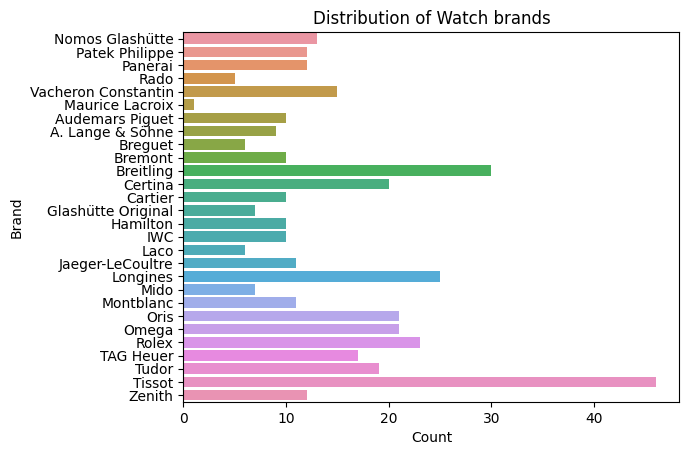

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# list of brands
brands = os.listdir(data_dir)

# count of images for each brand
brand_counts = {}

for brand in brands:
    brand_counts[brand] = len(os.listdir('/content/drive/MyDrive/included_data/' + brand))

# Plotting the distribution of brands
sns.barplot(x=list(brand_counts.values()), y=list(brand_counts.keys()))
plt.title('Distribution of Watch brands')
plt.xlabel('Count')
plt.ylabel('Brand')
plt.show()


In the plot above we can see that the most brands have approx. 10-14 models. There are a few, that have a lot more, like Breitling, Longines, Rolex, Tissot...

But this doesn't really say a lot. We need to know how many images per brand we have, because we like to classify on brands.

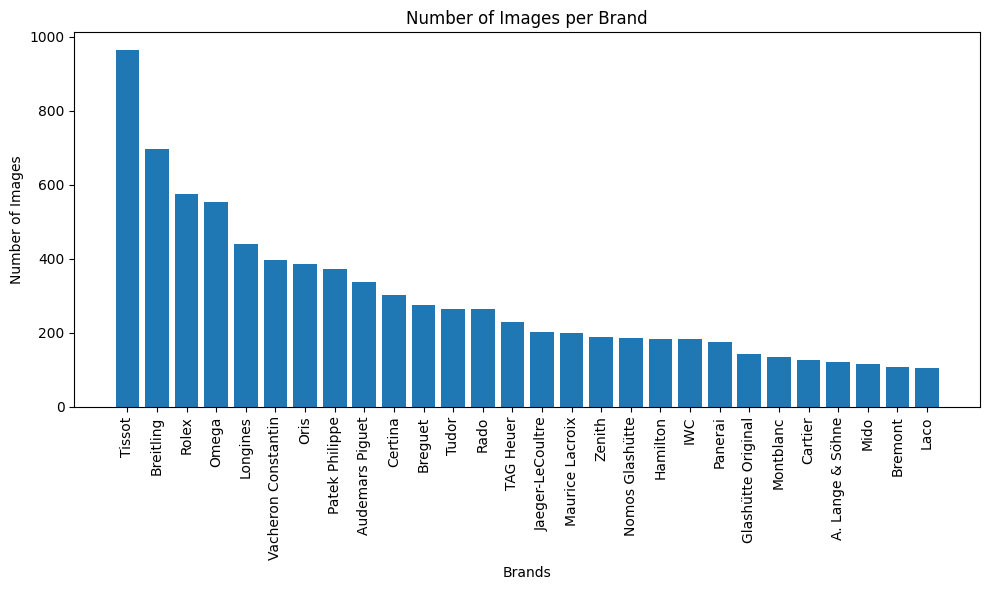

Total image files: 8217


In [ ]:
import os
import matplotlib.pyplot as plt

# Get a list of all brands
brands = os.listdir(data_dir)

# Initialize counters
brand_counts = []
total_images = 0

# Iterate over each brand
for brand in brands:
    brand_path = os.path.join(data_dir, brand)
    
    # Get a list of all models for the current brand
    models = os.listdir(brand_path)
    
    # Count the number of images for the current brand
    images_count = 0
    for model in models:
        model_path = os.path.join(brand_path, model)
        
        # Count the number of image files in the current model folder
        images = [file for file in os.listdir(model_path) if file.endswith(".jpg") or file.endswith(".png")]
        images_count += len(images)
    
    # Update the total number of images
    total_images += images_count
    
    # Add the brand and its image count to the list
    brand_counts.append((brand, images_count))

# Sort the brand_counts list based on image count in descending order
brand_counts.sort(key=lambda x: x[1], reverse=True)

# Extract brand names and image counts for plotting
brand_names = [brand[0] for brand in brand_counts]
image_counts = [brand[1] for brand in brand_counts]

# Plot the number of images per brand
plt.figure(figsize=(10, 6))
plt.bar(brand_names, image_counts)
plt.xlabel("Brands")
plt.ylabel("Number of Images")
plt.title("Number of Images per Brand")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Print the total number of image files
print(f"Total image files: {total_images}")

In this plot above we see the number fo images per brand. I'd say the average is about 200+ images per brand.

I didn't really know how many images were required.
I decided to look at the number of images per brand. (below)

In [ ]:
import os

# Get a list of all brands
brands = os.listdir(data_dir)

# Create a dictionary to store the total number of images per brand
brand_images = {}

# Iterate over each brand
for brand in brands:
    brand_path = os.path.join(data_dir, brand)
    
    # Get a list of all models for the current brand
    models = os.listdir(brand_path)
    
    # Initialize the total number of images for the current brand
    total_images = 0
    
    # Iterate over each model and count the number of images
    for model in models:
        model_path = os.path.join(brand_path, model)
        
        # Count the number of image files in the current model folder
        images = [file for file in os.listdir(model_path) if file.endswith(".jpg") or file.endswith(".png")]
        total_images += len(images)
    
    # Store the total number of images for the current brand in the dictionary
    brand_images[brand] = total_images

# Sort the brands based on the total number of images in descending order
sorted_brands = sorted(brand_images.items(), key=lambda x: x[1], reverse=True)

# Print the descending list of total images per brand
for brand, total_images in sorted_brands:
    print(f"{brand}: {total_images} images")


Tissot: 964 images
Breitling: 696 images
Rolex: 575 images
Omega: 552 images
Longines: 439 images
Vacheron Constantin: 396 images
Oris: 385 images
Patek Philippe: 372 images
Audemars Piguet: 336 images
Certina: 303 images
Breguet: 274 images
Tudor: 265 images
Rado: 264 images
TAG Heuer: 229 images
Jaeger-LeCoultre: 201 images
Maurice Lacroix: 200 images
Zenith: 189 images
Nomos Glashütte: 185 images
Hamilton: 184 images
IWC: 183 images
Panerai: 176 images
Glashütte Original: 142 images
Montblanc: 133 images
Cartier: 125 images
A. Lange & Söhne: 120 images
Mido: 116 images
Bremont: 108 images
Laco: 105 images


Regarding the class imbalance issue, my initial approach was to apply data augmentation on the train_dataset and utilize class weights to give more importance to the minority classes.

I decided against downsampling the dataset as a solution. Instead, I attempted to calculate weights per brand based on the number of images they had. The idea was to perform weighted oversampling for the minority classes (brands). However, this approach didn't yield the expected results, and I encountered difficulties along the way. 

Upon reflection, I realized that the issue stemmed from the way I split the data using "image_dataset_from_directory()". This function altered the format of the data, making it incompatible with the class_weights operation. In order to resolve this problem, it was necessary to split the data locally into train, test, and validation sets within the source_folder.

By splitting the data correctly into these subsets, I would be able to maintain the appropriate format for handling the class_weights operation. This adjustment was crucial for the successful implementation of the desired weighted oversampling technique or any other class balancing strategy.

Anyhow let's just continue...

**!!!DONT RUN THIS CELL, IT TAKES TO LONG (20min+)!!!**

Here I checked the file size distribution of all images.This step is important:


*   to ensure that all images are of similar quality and size
*   to detect anomalies or inconsistencies


 A consistent file sizes can prevent bias in the learning process and improve the overall performance of the classification model.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
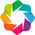

[########################################] | 100% Completed | 21m 54s


:Scatter   [height]   (width,count)

In [ ]:
import cv2
import os
from dask import bag
from dask.diagnostics import ProgressBar
import pandas as pd
import holoviews as hv
import hvplot.pandas  # optional, for hvplot integration with pandas

hv.extension('bokeh')

# Function to get image dimensions
def get_dims(file):
    img = cv2.imread(file)
    if img is not None:
        h, w = img.shape[:2]
        return h, w

# Function to traverse the directory structure and collect image files
def collect_image_files(directory):
    filelist = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith(('.jpg', '.jpeg', '.png', '.bmp')):
                filelist.append(os.path.join(root, file))
    return filelist

# Set your root directory containing subdirectories with images
root_directory = '/content/drive/MyDrive/included_data'

# Collect image files
filelist = collect_image_files(root_directory)

# Parallelize and compute image dimensions
dimsbag = bag.from_sequence(filelist).map(get_dims)

with ProgressBar():
    dims = dimsbag.compute()

dim_df = pd.DataFrame(dims, columns=['height', 'width'])
sizes = dim_df.groupby(['height', 'width']).size().reset_index().rename(columns={0: 'count'})
sizes.hvplot.scatter(x='height', y='width', size='count', xlim=(0, 1200), ylim=(0, 1200), grid=True,
                     xticks=2, yticks=2, height=500, width=600).options(scaling_factor=0.1, line_alpha=1, fill_alpha=0)


As we can see on the plot above most of my image are 165x165 or 474x474, the rest is smaller. (Option: Resizeing)

## Handling Class Imbalance

I created a data set oversampling and augmenting the data.
Lets display how the augmented data looks like for one example

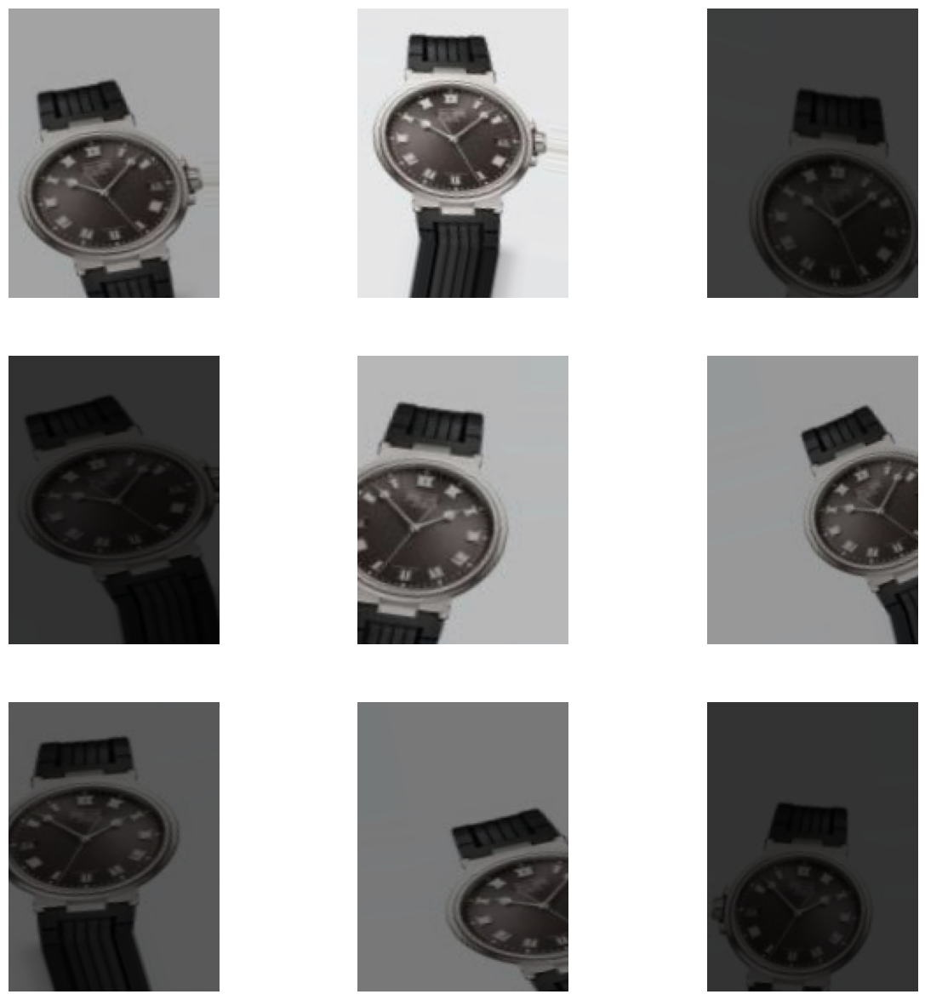

In [ ]:
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create a data generator with the same augmentations as before
datagen = ImageDataGenerator(rescale=1./255, 
                             rotation_range=15, 
                             width_shift_range=0.2,
                             height_shift_range=0.2,
                             brightness_range=[0.2,1.0],
                             zoom_range=0.2,
                             horizontal_flip=True)

# Choose a brand and a model
brand = 'Breguet'
model = 'Marine'  # Replace 'some_model' with an actual model name

# Specify the directory of augmented images for this brand and model
directory = f'/content/drive/MyDrive/augmented_data/{brand}/{model}'

# Get the names of all images in this directory
image_names = os.listdir(directory)

# Load the first image
image_path = os.path.join(directory, image_names[0])
image = load_img(image_path)
image = img_to_array(image)
image = image.reshape((1,) + image.shape)

# Display the original image and some of its augmented versions
plt.figure(figsize=(15, 15))
for i, batch in enumerate(datagen.flow(image, batch_size=1)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(batch[0])
    plt.axis("off")

    if i >= 8:  # stop after 9 images
        break


Here I concatenate the original and the oversampled minority classes.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import itertools

# Create a data generator for the original data
datagen_original = ImageDataGenerator(rescale=1./255)
generator_original = datagen_original.flow_from_directory(
        '/content/drive/MyDrive/included_data',
        target_size=(150, 150),  # Resize all images to 150x150
        batch_size=32,
        class_mode='sparse')

# Create a data generator for the augmented data
datagen_augmented = ImageDataGenerator(rescale=1./255)
generator_augmented = datagen_augmented.flow_from_directory(
        '/content/drive/MyDrive/augmented_data',
        target_size=(150, 150),  # Resize all images to 150x150
        batch_size=32,
        class_mode='sparse')

# Concatenate the original and augmented data
generator_combined = itertools.chain(generator_original, generator_augmented)


Found 8217 images belonging to 28 classes.
Found 33964 images belonging to 20 classes.


In [ ]:
# Get class indices
class_indices = generator_original.class_indices

# Initialize a dictionary to hold the counts
class_counts = {class_name: 0 for class_name in class_indices.keys()}

# Count the images in the original generator
for class_label in generator_original.classes:
    class_name = list(class_indices.keys())[list(class_indices.values()).index(class_label)]
    class_counts[class_name] += 1

# Count the images in the augmented generator
for class_label in generator_augmented.classes:
    class_name = list(class_indices.keys())[list(class_indices.values()).index(class_label)]
    class_counts[class_name] += 1

# Now class_counts should hold the total number of images per class
for class_name, count in class_counts.items():
    print(f'{class_name}: {count} images')


A. Lange & Söhne: 1430 images
Audemars Piguet: 3105 images
Breguet: 1451 images
Breitling: 2056 images
Bremont: 108 images
Cartier: 1670 images
Certina: 2305 images
Glashütte Original: 2140 images
Hamilton: 2370 images
IWC: 1060 images
Jaeger-LeCoultre: 2191 images
Laco: 1366 images
Longines: 1890 images
Maurice Lacroix: 2214 images
Mido: 2038 images
Montblanc: 2795 images
Nomos Glashütte: 185 images
Omega: 3043 images
Oris: 3279 images
Panerai: 2231 images
Patek Philippe: 372 images
Rado: 264 images
Rolex: 575 images
TAG Heuer: 229 images
Tissot: 964 images
Tudor: 265 images
Vacheron Constantin: 396 images
Zenith: 189 images


##Split Data into Train, Test, Validation
Know I split my original & augmented data into train test validation and the augmented into train & validation and merge then again in the end.

In [ ]:
import tensorflow as tf

data_dir_original = os.path.join(os.curdir, '/content/drive/MyDrive/included_data')
data_dir_augmented = os.path.join(os.curdir, '/content/drive/MyDrive/augmented_data')

BATCH_SIZE = 32
IMG_SIZE = (165, 165)


# Create datasets for original data
train_dataset_original = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_original,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE)

validation_dataset_original = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_original,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE)

# Create datasets for augmented data
train_dataset_augmented = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_augmented,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE)

validation_dataset_augmented = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir_augmented,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE)

# Combine the datasets
train_dataset = train_dataset_original.concatenate(train_dataset_augmented)
validation_dataset = validation_dataset_original.concatenate(validation_dataset_augmented)



Found 8217 files belonging to 28 classes.
Using 6574 files for training.
Found 8217 files belonging to 28 classes.
Using 1643 files for validation.
Found 33964 files belonging to 20 classes.
Using 27172 files for training.
Found 33964 files belonging to 20 classes.
Using 6792 files for validation.


In [ ]:
# Determine the number of samples for validation and test sets
validation_batches = tf.data.experimental.cardinality(validation_dataset)
test_batches = validation_batches // 5

# Split the validation dataset into validation and test sets
validation_dataset = validation_dataset.skip(test_batches)
test_dataset = validation_dataset.take(test_batches)

print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset))


Number of validation batches: 212
Number of test batches: 53


As recommended in the lesson:
It is convenient to use buffered prefetching to load images from disk without having I/O become blocking. That is what the next cell does.

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

## Apply Data Augmentation on the fly

In [ ]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
  tf.keras.layers.experimental.preprocessing.RandomZoom(0.4),
  tf.keras.layers.experimental.preprocessing.RandomCrop(165, 165),
  tf.keras.layers.experimental.preprocessing.CenterCrop(165, 165),
])

Here I display a sample image of my original data and the augmented one from the taining dataset

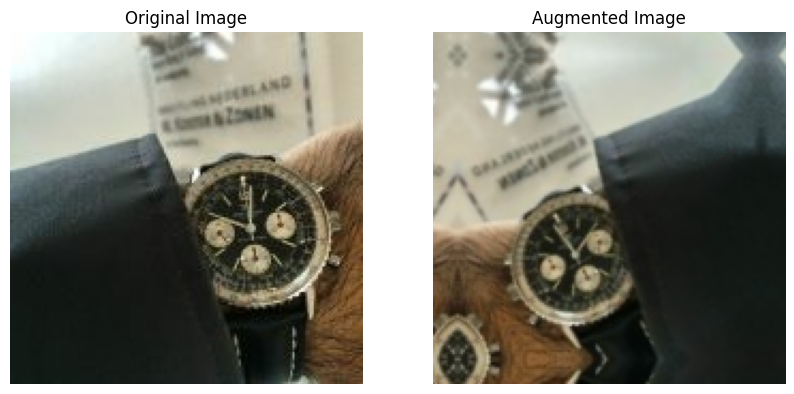

In [ ]:
import matplotlib.pyplot as plt

# Take one batch from your training dataset
for images, labels in train_dataset.take(1):
    # Take the first image from the batch
    image = images[0]

    # Apply data augmentation
    augmented_image = data_augmentation(tf.expand_dims(image, 0))

    # Plot the original and augmented images for comparison
    fig, (ax1, ax2) = plt.subplots(figsize=(10, 5), ncols=2)

    # Original image
    ax1.imshow(image.numpy().astype("uint8"))
    ax1.set_title("Original Image")
    ax1.axis("off")

    # Augmented image
    ax2.imshow(augmented_image[0].numpy().astype("uint8"))
    ax2.set_title("Augmented Image")
    ax2.axis("off")


## Creating a model 

I created a Convolutional Neural Network (CNN).

I added Conv2D-layers, all with the 3x3 size of filers and increased the number of filters on each convolution (32,64,128), so the CNN can learn from more basic stuff (edges and forms) to more specific things.

On each convolution I added:


*   Batchnormaliztaion layer, that normalizes the output of each layer.
*   Activation Function, that adds non-linearity
*   Max Pooling layers, that reduce the dimensions
*   Drop out layer, that deactivate here 50% of the neurons, that the model learns new and gets more robust


*   Flattening: reduces images (2D) to (1D)
*   Dense layers, to fully connect all the neurons

First I had a drop out rate for 0.2/ 0.3 and then I increased it to 0.5, that worked the best.

I also added a whole new convolutional layer and experimented with the activation functions (softmax, tanh, swish), but
relu ( rectified linear unit) worked the best in my case.

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense, Input, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator

input_shape = (165, 165, 3)  # Update this to match your image dimensions, including color channels
number_of_classes = 28  # Update this to match the number of classes in your data

# Define model architecture
inputs = Input(shape=input_shape)

x = Conv2D(32, (3, 3), padding='same')(inputs)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=(2, 2), padding='same')(x)

x = Conv2D(64, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=(2, 2), padding='same')(x)
x = Dropout(0.5)(x)  # Increased dropout rate

x = Conv2D(128, (3, 3), padding='same')(x)  # Added extra conv layer
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=(2, 2), padding='same')(x)
x = Dropout(0.5)(x)

x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)  # Added dropout after dense layer

x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)
x = Dense(64, activation='relu')(x)
outputs = Dense(number_of_classes, activation='softmax')(x)

model = Model(inputs, outputs)


## Training & Evaluation

Here I configure my trainig, with model. compile.

I reduced the laring_rate of the adam optimizer from 0.001(default) to 0.0001, which also boosted my model performance.

beacuse I selected class_mode = sparse in my code before. I now chose spares_categorical_corssentropy and selecte accuracy as my metrics for measurement.

In [ ]:
# Compile model
opt = Adam(learning_rate=0.0001)  # Reduced learning rate
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

I included early_stopping with a patience of 5, so my training stopps if my validation loss doesn't imporve after 6 epoches, the trainig stops.

In [ ]:
# Set callbacks for early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)

Here I create a folder in my drive that saves the model to a folder named: "model_5", whihn that folder *(model_dir path must be changed to create new folder)* it saves the base_model and the best_model, which is updated after each improving epoch.

I run my trainig for 100 epoches. I started with less epoches, 10, 20, 40, 50... til 100. I realised longer training gave the model more time to increase in accuracy.

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Path where the model and its weights will be saved
model_dir = "/content/drive/MyDrive/model_5/"
os.makedirs(model_dir, exist_ok=True)

# Save the initial model weights for later comparison
model.save_weights(os.path.join(model_dir, 'base_model.h5'))

# Use ModelCheckpoint to save the best model during training
checkpoint = ModelCheckpoint(os.path.join(model_dir, 'best_model.h5'), 
                             monitor='val_accuracy', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='max')

# Set callbacks for early stopping
early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=5, 
                               verbose=1, 
                               restore_best_weights=True)

# Fit model
history = model.fit(train_dataset,
                    epochs=100,  # Adjust according to your needs
                    validation_data=validation_dataset,
                    callbacks=[checkpoint, early_stopping])


Epoch 1/100
1055/1056 [============================>.] - ETA: 0s - loss: 2.7313 - accuracy: 0.1994
Epoch 1: val_accuracy improved from -inf to 0.24364, saving model to /content/drive/MyDrive/model_5/best_model.h5
1056/1056 [==============================] - 27s 21ms/step - loss: 2.7312 - accuracy: 0.1994 - val_loss: 2.4052 - val_accuracy: 0.2436
Epoch 2/100
1056/1056 [==============================] - ETA: 0s - loss: 2.3526 - accuracy: 0.2894
Epoch 2: val_accuracy did not improve from 0.24364
1056/1056 [==============================] - 22s 21ms/step - loss: 2.3526 - accuracy: 0.2894 - val_loss: 2.5034 - val_accuracy: 0.2303
Epoch 3/100
1055/1056 [============================>.] - ETA: 0s - loss: 2.1915 - accuracy: 0.3248
Epoch 3: val_accuracy improved from 0.24364 to 0.25059, saving model to /content/drive/MyDrive/model_5/best_model.h5
1056/1056 [==============================] - 24s 22ms/step - loss: 2.1915 - accuracy: 0.3249 - val_loss: 2.6250 - val_accuracy: 0.2506
Epoch 4/100
1054

### Plotting model accuracy & loss

Here I plot the model accuracy and the model loss from the training.

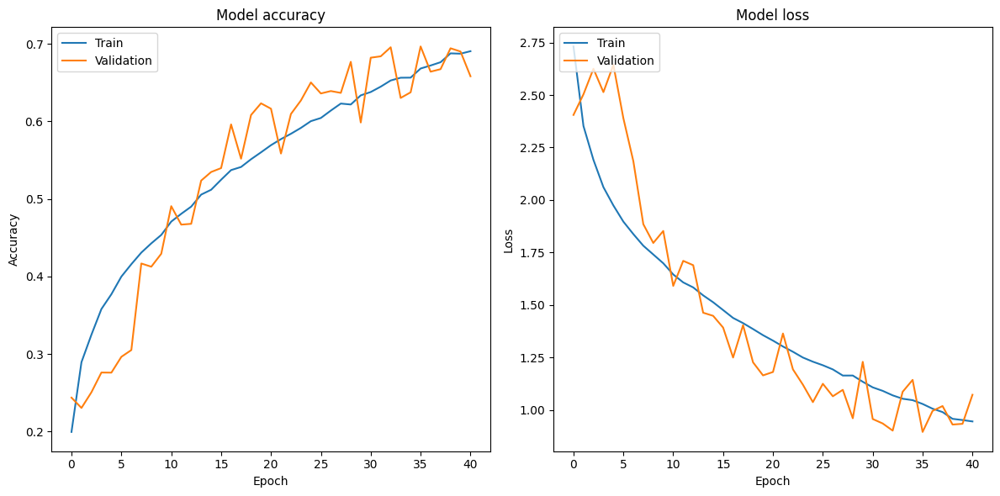

In [ ]:
# Plot the accuracy chart
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot the loss chart
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()

###Evaluation:

**Training & Validation Accuracy**: My model's accuracy on the training & validation set is increasing with each epoch. This is a good sign and shows that my model is learning to classify the data in the training set correctly. On my validation set my model seems to generalizing well to unseen data, and not just memorizing the training data.


In my case, there is no clear sign of overfitting, as the validation accuracy is still improving.It is slightly underfitting at the beginning and the slighly overfitting at the end of the training. 

**Validation Loss:** My validation loss seems to be more volatile , this might indicate that my model is struggling to improve its predictions on the validation set consistently.



### Making predictions

I try to make some predictions with the model I created. Here in this case, my model has an accuracy of 69% *(can be changed, when changing the path)*. Let's see...

1/1 [==============================] - 0s 143ms/step


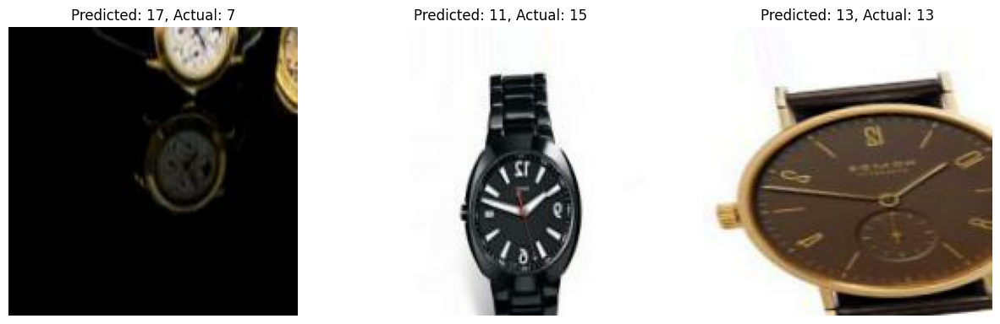

In [ ]:
import numpy as np

# Load your trained model
model = tf.keras.models.load_model('/content/drive/MyDrive/model_5_69%/best_model.h5') # update here the model

# Get 3 random batches from the test dataset
random_batches = np.random.choice(tf.data.experimental.cardinality(test_dataset), size=3)

# Get the images and labels
images = []
labels = []
for i, batch in enumerate(test_dataset):
    if i in random_batches:
        image, label = batch
        images.append(image[0])  # Assuming batch size is 1
        labels.append(label[0])  # Assuming batch size is 1

# Convert images to numpy array for prediction
images = np.array(images)

# Make predictions
predictions = model.predict(images)
predicted_labels = np.argmax(predictions, axis=1)

# Plot images, predicted labels, and actual labels
plt.figure(figsize=(15, 5))
for i in range(3):
    ax = plt.subplot(1, 3, i + 1)
    plt.imshow(images[i].astype("uint8"))
    plt.title(f"Predicted: {predicted_labels[i]}, Actual: {labels[i]}")
    plt.axis("off")


As a result of the predictions (predicted & actual), we see, that only 1 out of 3, images were predicted correctly.

*This result might change, because it takes 3 random images out of the test-dataset and I didn't set a seed*

# Xception as Transfer Learning Model

After some [research on pretrained image](https://keras.io/api/applications/) calssification models I decided to try the 
[Xception](https://keras.io/api/applications/xception/) model, trained on ImageNet weights.

[-1,1]

Here I initiate the Xception model with:

1.   Input Shape (165,165,3)
2.  weights = pretrained on ImageNet
3. with setting include_top = False I refuse to use the fully connected layers that are on top of the network


In [ ]:
import tensorflow as tf

BATCH_SIZE = 32     #same as before
IMG_SIZE = (165, 165)  #same as before

preprocess_input = tf.keras.applications.xception.preprocess_input

# Create the base model from the pre-trained model Xception
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.Xception(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

feature extractor converts 165,165,3 into 32,5,5,2048 block of features

In [ ]:
image_batch, label_batch = next(iter(train_dataset))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 5, 5, 2048)


Here I freeze the weights, and print, if they are really frozen (print false = frozen)

In [ ]:
base_model.trainable = False #freezing
print(base_model.trainable) # if False, it confirms that the model's trainable parameters 
                            # are indeed frozen, and the weights will not be updated during training

False


# Transfer Learning Setup

As seen before we have fozen the trainable parameters, so we keep the pretrained weights and prevent them from updating during training.
This helps me to use the Xception model as a feature extractor.
Now the model is ready to learn additional features from my watches (I hope so.)



In [ ]:
base_model.summary()

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 165, 165, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 82, 82, 32)   864         ['input_9[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 82, 82, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                           

Here we again see a confirmation, that the weights are frozen, because the trainable parameters are = 0.

apply data_augmentation once again...

*if the whole dataset is beeing run at once, this musn't be run (voluntary)*

In [ ]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
  tf.keras.layers.experimental.preprocessing.RandomZoom(0.4),
  tf.keras.layers.experimental.preprocessing.RandomCrop(165, 165),
  tf.keras.layers.experimental.preprocessing.CenterCrop(165, 165),
])

We will now add our own custom layers on top of the frozen Xception base and train only these new layers. This way, we can adapt the model to our specific task while leveraging the valuable features learned by Xception.

By utilizing transfer learning in this manner, we aim to achieve better performance with less training time and data requirements.

In [ ]:
# inputs = tf.keras.Input(shape=IMG_SHAPE)
# x = data_augmentation(inputs)
# x = preprocess_input(x)
# x = base_model(x, training=False) #We need to set `training=False` as our model contains a `BatchNormalization` layer. More explanation here https://www.tensorflow.org/guide/keras/transfer_learning
# x = tf.keras.layers.GlobalAveragePooling2D()(x) #this layer has the same purpose as tf.keras.layers.Flatten(). Need to connect something 2D to something 1D.
# x = tf.keras.layers.Dense(32, activation="relu")(x)
# x = tf.keras.layers.Dropout(0.2)(x)
# x = tf.keras.layers.Dense(16, activation="relu")(x)
# x = tf.keras.layers.Dropout(0.2)(x)
# outputs = tf.keras.layers.Dense(28, activation="softmax")(x) #!!!define number of classes, in my case 28
# model = tf.keras.Model(inputs, outputs)


inputs = tf.keras.Input(shape=IMG_SHAPE)
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False) 
x = tf.keras.layers.GlobalAveragePooling2D()(x)

# Increase the number of units in your Dense layers
x = tf.keras.layers.Dense(128, activation="relu")(x)
x = tf.keras.layers.BatchNormalization()(x)  
x = tf.keras.layers.Dropout(0.5)(x)  

x = tf.keras.layers.Dense(64, activation="relu")(x)
x = tf.keras.layers.BatchNormalization()(x) 
x = tf.keras.layers.Dropout(0.5)(x) 

outputs = tf.keras.layers.Dense(28, activation="softmax")(x)
model = tf.keras.Model(inputs, outputs)

Here I again reduced the learning rate *(same as before)*

In [ ]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 165, 165, 3)]     0         
                                                                 
 sequential_7 (Sequential)   (None, 165, 165, 3)       0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 165, 165, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 165, 165, 3)      0         
 bda)                                                            
                                                                 
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0   

## Model Training (Transfer Learning)

I first look how te Xception model would perform on the validation dataset, without training the model.

In [ ]:
initial_epochs = 100

loss0, accuracy0 = model.evaluate(validation_dataset)

212/212 [==============================] - 6s 15ms/step - loss: 3.4663 - accuracy: 0.0321


In [ ]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 3.47
initial accuracy: 0.03


(above) as you can see above, it performs poorly

(below) here I once again implement eary stopping and saving the model to a folder

*(path to folder needs to be adjusted)*

In [ ]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Path where the model and its weights will be saved
model_dir = "/content/drive/MyDrive/trasfer_Xception_1/"
os.makedirs(model_dir, exist_ok=True)

# Save the initial model weights for later comparison
model.save_weights(os.path.join(model_dir, 'base_model.h5'))

# Use ModelCheckpoint to save the best model during training
checkpoint = ModelCheckpoint(os.path.join(model_dir, 'best_model.h5'), 
                             monitor='val_loss', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min')

# Set callbacks for early stopping
early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=5, 
                               verbose=1, 
                               restore_best_weights=True)



Here I run the trainig...

In [ ]:
# Fit model
history = model.fit(
    train_dataset,
    epochs=initial_epochs,
    validation_data=validation_dataset,
    callbacks=[checkpoint, early_stopping]
)

Epoch 1/100
1056/1056 [==============================] - ETA: 0s - loss: 3.1454 - accuracy: 0.0946
Epoch 1: val_loss improved from inf to 2.74917, saving model to /content/drive/MyDrive/trasfer_Xception_1/best_model.h5
1056/1056 [==============================] - 28s 22ms/step - loss: 3.1454 - accuracy: 0.0946 - val_loss: 2.7492 - val_accuracy: 0.2206
Epoch 2/100
1054/1056 [============================>.] - ETA: 0s - loss: 2.9074 - accuracy: 0.1553
Epoch 2: val_loss improved from 2.74917 to 2.46370, saving model to /content/drive/MyDrive/trasfer_Xception_1/best_model.h5
1056/1056 [==============================] - 23s 22ms/step - loss: 2.9073 - accuracy: 0.1554 - val_loss: 2.4637 - val_accuracy: 0.2753
Epoch 3/100
1053/1056 [============================>.] - ETA: 0s - loss: 2.7810 - accuracy: 0.1864
Epoch 3: val_loss improved from 2.46370 to 2.31480, saving model to /content/drive/MyDrive/trasfer_Xception_1/best_model.h5
1056/1056 [==============================] - 23s 22ms/step - loss

Text(0.5, 1.0, 'Training and Validation Accuracy')

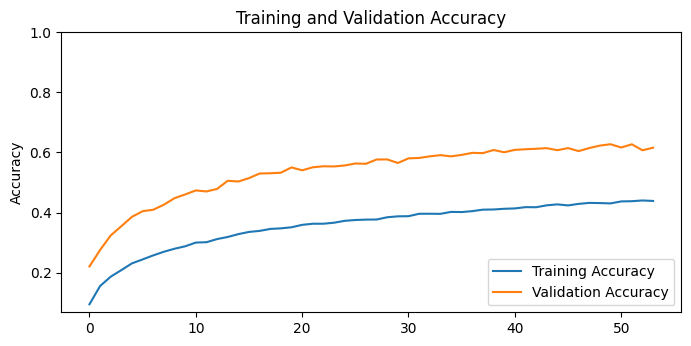

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

# outcommented later uncomment again
# plt.subplot(2, 1, 2)
# plt.plot(loss, label='Training Loss')
# plt.plot(val_loss, label='Validation Loss')
# plt.legend(loc='upper right')
# plt.ylabel('Cross Entropy')
# plt.ylim([0,1.0])
# plt.title('Training and Validation Loss')
# plt.xlabel('epoch')
# plt.show()

## Evaluation Transfer learning

Here I clearly see, that my validation accuracy is much higher, than the training accuracy. Here it' overfits.

I guess it is because of the high dropout layer I implemented. In the next training I reduced it.

## Fine Tuning the Transfer learned Xception model

Know I unfreeze the pretrained model

In [ ]:
base_model.trainable = True

In [ ]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

Number of layers in the base model:  132


In [ ]:
fine_tune_at = 122

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

lowering the learning rate even more...

In [ ]:
model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              optimizer = tf.keras.optimizers.Adam(learning_rate=base_learning_rate/10),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 165, 165, 3)]     0         
                                                                 
 conv2d_15 (Conv2D)          (None, 165, 165, 32)      896       
                                                                 
 batch_normalization_20 (Bat  (None, 165, 165, 32)     128       
 chNormalization)                                                
                                                                 
 activation_15 (Activation)  (None, 165, 165, 32)      0         
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 83, 83, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_16 (Conv2D)          (None, 83, 83, 64)        1849

Here I finetune the transferlearned Xception model for 20 more epochs. You can see that the training is continuing, because it starts at epoch it stopped before.

Here I finetune the Xception model for 20 more epoches and I can see that

In [ ]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=validation_dataset)

Epoch 54/120
1056/1056 [==============================] - 26s 21ms/step - loss: 1.1013 - accuracy: 0.6541 - val_loss: 0.8048 - val_accuracy: 0.7361
Epoch 55/120
1056/1056 [==============================] - 22s 20ms/step - loss: 1.0203 - accuracy: 0.6723 - val_loss: 0.8066 - val_accuracy: 0.7334
Epoch 56/120
1056/1056 [==============================] - 22s 20ms/step - loss: 0.9849 - accuracy: 0.6817 - val_loss: 0.7834 - val_accuracy: 0.7444
Epoch 57/120
1056/1056 [==============================] - 22s 20ms/step - loss: 0.9928 - accuracy: 0.6793 - val_loss: 0.8207 - val_accuracy: 0.7312
Epoch 58/120
1056/1056 [==============================] - 22s 20ms/step - loss: 0.9819 - accuracy: 0.6801 - val_loss: 0.7942 - val_accuracy: 0.7391
Epoch 59/120
1056/1056 [==============================] - 21s 20ms/step - loss: 0.9715 - accuracy: 0.6823 - val_loss: 0.7860 - val_accuracy: 0.7438
Epoch 60/120
1056/1056 [==============================] - 22s 20ms/step - loss: 0.9645 - accuracy: 0.6875 - val_

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

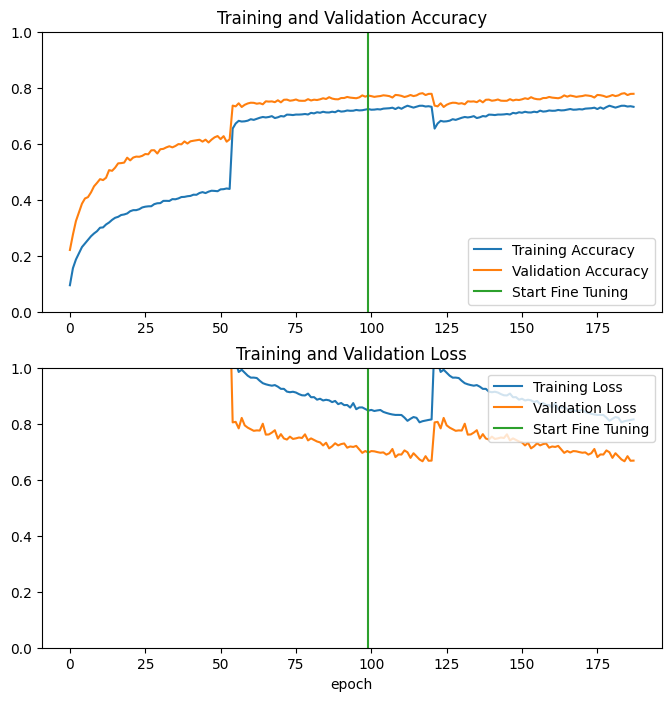

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

## Evaluation (Fine-Tuning)

As you may now see is that the model still overfits, and only improved about 10% in accuary on the test data. (below)


# Evaluation & Prediction

In [ ]:
loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

53/53 [==============================] - 2s 14ms/step - loss: 0.6920 - accuracy: 0.7683
Test accuracy : 0.7682783007621765


Here I make a few predictions: 

In [ ]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch)

predicted_classes = tf.argmax(predictions, axis=1).numpy()

print('Predictions:\n', predicted_classes)
print('Labels:\n', label_batch)


Predictions:
 [13  1  6 10  2  7  2 12 14  8  7  8  8  7 19  8 18  5  0 18 19 14 13 18
 12  2 10  7 15 19  8  1]
Labels:
 [13  1 12 10  2  8  8 12 14  6 19  7  8  7 19  8 18  0  0 18 19 14 13 18
 12 17  1  8 15 19  8  1]


As you may see that out fo the 33 predcions I made 20 were correct with the finetuned model.
That's not bad.


# Overall Model Performance Evaluation

In this project, we deployed and evaluated several machine learning models for image classification, notably a custom built model and a pre-trained model (Xception) adapted via transfer learning and further fine-tuning. The aim was to assess the effectiveness of these models, the impact of specific architectural choices, and the benefits of leveraging pre-trained networks.

## Custom Model Evaluation

In the custom-trained model I exhibited respectable performance with an accuracy of 69%. The validation curve, while jagged, did not show signs of overfitting, indicating that the model was learning effectively. Despite this, the inconsistent validation accuracy suggests that the model's predictions may not be entirely reliable. 

One of the challenges I faced was in balancing complexity and performance. Several modifications were made to the model's architecture in pursuit of this balance, including an increase in the dropout rate to prevent overfitting, a reduction in the learning rate to allow more precise convergence, and the addition of an extra convolutional layer and more dense layers to capture more complex patterns in the data. 

## Xception Model Evaluation

I then turned my attention to the Xception model, a **pre-trained** network renowned for its prowess in image classification tasks. Before any fine-tuning, the model's performance was significantly underwhelming, achieving, only 3% accuracy. However, with the introduction of transfer learning, the model's performance quickly soared to 43.1%, underscoring the value of applying knowledge gleaned from pre-existing large datasets.

Despite the improvement, the performance of the model was not yet satisfactory. Therefore, I proceeded to **fine-tune the model**, which led to a remarkable leap in performance. The fine-tuned Xception model achieved a validation accuracy of about 75% and a test accuracy of 76%, surpassing the performance of the custom model.

Key to achieving this performance was the careful tweaking of the model architecture. I expanded the number of units in the dense layers from 32, 16 to 128, 64, which enabled the model to capture more complex features. I also moderated the dropout rate to address the issue of overfitting that became apparent during the training process.

## Future Improvements

The results of this project illustrate the strength of transfer learning and model fine-tuning. 

If I had the chance to start over again, I would wish a more powerfull and reliable platform than Google Colab. *just hat to mention it*


